In [1]:
import pandas as pd; pd.set_option('display.max_columns', None)
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

#### 1. скачать набор данных маркетинговых кампаний отсюда https://www.kaggle.com/davinwijaya/customer-retention

In [2]:
df = pd.read_csv('C:/Users/yana/2/data.csv')
df.head(5)

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,offer,conversion
0,10,142.44,1,0,Surburban,0,Phone,Buy One Get One,0
1,6,329.08,1,1,Rural,1,Web,No Offer,0
2,7,180.65,0,1,Surburban,1,Web,Buy One Get One,0
3,9,675.83,1,0,Rural,1,Web,Discount,0
4,2,45.34,1,0,Urban,0,Web,Buy One Get One,0


#### 2. там поле conversion - это целевая переменная, а offer - коммуникация. Переименовать поля (conversion -> target, offer -> treatment) и привести поле treatment к бинарному виду (1 или 0, т.е было какое-то предложение или нет) - значение No Offer означает отсутствие коммуникации, а все остальные - наличие.

In [3]:
df=df.rename(columns={'offer': 'treatment', 'conversion': 'target'})
df.head(5)

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,treatment,target
0,10,142.44,1,0,Surburban,0,Phone,Buy One Get One,0
1,6,329.08,1,1,Rural,1,Web,No Offer,0
2,7,180.65,0,1,Surburban,1,Web,Buy One Get One,0
3,9,675.83,1,0,Rural,1,Web,Discount,0
4,2,45.34,1,0,Urban,0,Web,Buy One Get One,0


In [4]:
df['treatment'].value_counts()

Buy One Get One    21387
Discount           21307
No Offer           21306
Name: treatment, dtype: int64

In [5]:
df['treatment'] = np.where(df['treatment']=='No Offer', 0, 1)
df.head(3)

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,treatment,target
0,10,142.44,1,0,Surburban,0,Phone,1,0
1,6,329.08,1,1,Rural,1,Web,0,0
2,7,180.65,0,1,Surburban,1,Web,1,0


#### 3. сделать разбиение набора данных не тренировочную и тестовую выборки

In [6]:
# до разбиения подробнее рассмотрим датасет
df.isnull().sum()

recency          0
history          0
used_discount    0
used_bogo        0
zip_code         0
is_referral      0
channel          0
treatment        0
target           0
dtype: int64

In [7]:
df.describe()

,recency,history,used_discount,used_bogo,is_referral,treatment,target
count,64000.000000,64000.000000,64000.000000,64000.000000,64000.000000,64000.000000,64000.000000
mean,5.763734,242.085656,0.551031,0.549719,0.502250,0.667094,0.146781
std,3.507592,256.158608,0.497393,0.497526,0.499999,0.471257,0.353890
min,1.000000,29.990000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,64.660000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,6.000000,158.110000,1.000000,1.000000,1.000000,1.000000,0.000000
75%,9.000000,325.657500,1.000000,1.000000,1.000000,1.000000,0.000000
max,12.000000,3345.930000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
df.dtypes

recency            int64
history          float64
used_discount      int64
used_bogo          int64
zip_code          object
is_referral        int64
channel           object
treatment          int32
target             int64
dtype: object

In [9]:
df['zip_code'].astype('str')
df['channel'].astype('str')

0               Phone
1                 Web
2                 Web
3                 Web
4                 Web
             ...     
63995             Web
63996           Phone
63997           Phone
63998    Multichannel
63999             Web
Name: channel, Length: 64000, dtype: object

In [10]:
df['target'].value_counts() #несбалансированный датасет

0    54606
1     9394
Name: target, dtype: int64

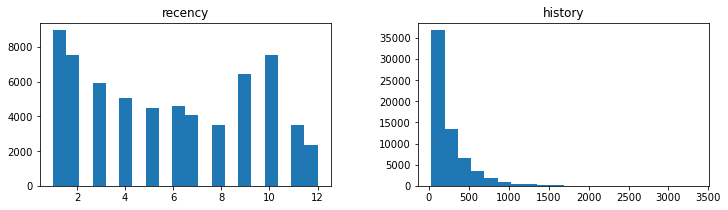

In [11]:
num_features = df[['recency', 'history']]
num_features.hist(figsize=(12,3), bins=20, grid=False);

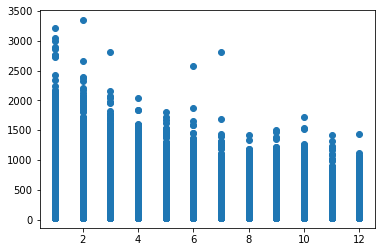

In [12]:
plt.scatter(df['recency'], df['history'])

Выбросов не наблюдается. Все клиенты что-то покупали за последний год, большинство клиентов потратили скромные суммы. Есть постоянные клиенты, которые, видимо, чаще взаимодействуют с сервисом и тратят больше

In [13]:
df_train, df_test = train_test_split(df, test_size=0.3, random_state=123)

#### 4. сделать feature engineering на ваше усмотрение (допускается свобода выбора методов)

In [14]:
# попытка стардартизации количественных признаков через Standardscaler негативно отразилась на результатах модели
# объединим "used discount" и "used bogo" в один суммарный признак, т.к. в рамках treatment нам не важно, какое именно
# предложение должно быть сделано клиенту. И выделим клиентов, которые платили много денег, но давно ничего не покупали
def features(df):
    df['used_offer'] = df['used_discount']+df['used_bogo']
    df.drop(['used_discount', 'used_bogo'], axis=1, inplace=True)
    df['old_clients'] = df['history'] / 12 * df['recency']
    return df

In [15]:
df_train = features(df_train)
df_test = features(df_test)
df_train

,recency,history,zip_code,is_referral,channel,treatment,target,used_offer,old_clients
53181,8,121.56,Surburban,0,Web,0,0,1,81.040000
42635,9,617.62,Urban,1,Phone,1,0,1,463.215000
6296,5,185.62,Rural,1,Web,0,1,1,77.341667
41722,1,359.03,Rural,0,Web,1,0,1,29.919167
32660,10,139.68,Urban,0,Web,1,0,1,116.400000
...,...,...,...,...,...,...,...,...,...
61404,1,172.98,Surburban,0,Web,1,0,1,14.415000
17730,9,95.41,Surburban,0,Phone,1,0,1,71.557500
28030,1,547.69,Rural,1,Multichannel,0,1,2,45.640833
15725,5,341.39,Surburban,0,Phone,1,1,1,142.245833


In [16]:
X_train = df_train.drop(['treatment', 'target'], axis=1, inplace=False)
y_train = df_train['target']
treat_train = df_train['treatment']

X_test = df_test.drop(['treatment', 'target'], axis=1, inplace=False)
y_test = df_test['target']
treat_test = df_test['treatment']

models_results = {
    'approach': [],
    'uplift@10%': [],
    'uplift@20%': [],
    'uplift@30%': [],
}

#### 5. провести uplift-моделирование 3 способами: одна модель с признаком коммуникации (S learner), модель с трансформацией таргета (трансформация классов п. 2. 1) и вариант с двумя независимыми моделями

In [17]:
from sklift.metrics import uplift_at_k
from sklift.viz import plot_uplift_preds
from sklift.models import SoloModel
from catboost import CatBoostClassifier

In [18]:
cat_features = ['zip_code', 'is_referral', 'channel', 'used_offer']

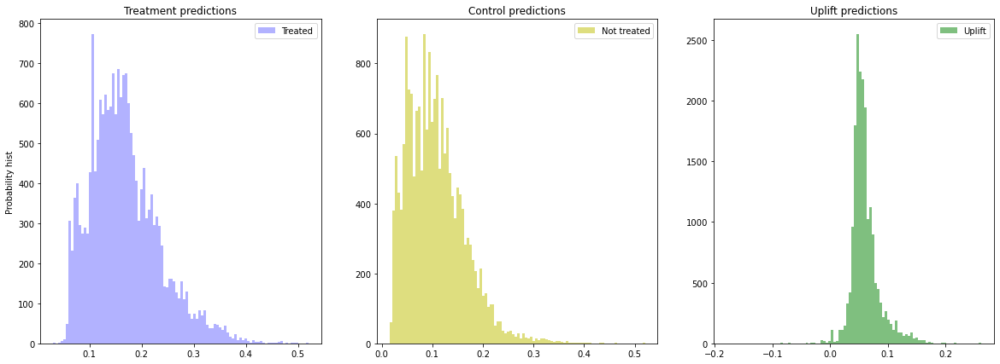

In [19]:
sm = SoloModel(CatBoostClassifier(iterations=50, thread_count=2, random_state=42, silent=True))
sm = sm.fit(X_train, y_train, treat_train, estimator_fit_params={'cat_features': cat_features})

uplift_sm = sm.predict(X_test)

sm_score10 = uplift_at_k(y_true=y_test, uplift=uplift_sm, treatment=treat_test, strategy='by_group', k=0.1)
sm_score20 = uplift_at_k(y_true=y_test, uplift=uplift_sm, treatment=treat_test, strategy='by_group', k=0.2)
sm_score30 = uplift_at_k(y_true=y_test, uplift=uplift_sm, treatment=treat_test, strategy='by_group', k=0.3)

models_results['approach'].append('SoloModel')
models_results['uplift@10%'].append(sm_score10)
models_results['uplift@20%'].append(sm_score20)
models_results['uplift@30%'].append(sm_score30)

# Получим условные вероятности выполнения целевого действия при взаимодействии для каждого объекта
sm_trmnt_preds = sm.trmnt_preds_
# И условные вероятности выполнения целевого действия без взаимодействия для каждого объекта
sm_ctrl_preds = sm.ctrl_preds_

# Отрисуем распределения вероятностей и их разность (uplift)
plot_uplift_preds(trmnt_preds=sm_trmnt_preds, ctrl_preds=sm_ctrl_preds);

In [20]:
from sklift.models import ClassTransformation


ct = ClassTransformation(CatBoostClassifier(iterations=50, thread_count=2, random_state=42, silent=True))
ct = ct.fit(X_train, y_train, treat_train, estimator_fit_params={'cat_features': cat_features})

uplift_ct = ct.predict(X_test)

ct_score10 = uplift_at_k(y_true=y_test, uplift=uplift_ct, treatment=treat_test, strategy='by_group', k=0.1)
ct_score20 = uplift_at_k(y_true=y_test, uplift=uplift_ct, treatment=treat_test, strategy='by_group', k=0.2)
ct_score30 = uplift_at_k(y_true=y_test, uplift=uplift_ct, treatment=treat_test, strategy='by_group', k=0.3)

models_results['approach'].append('ClassTransformation')
models_results['uplift@10%'].append(ct_score10)
models_results['uplift@20%'].append(ct_score20)
models_results['uplift@30%'].append(ct_score30)

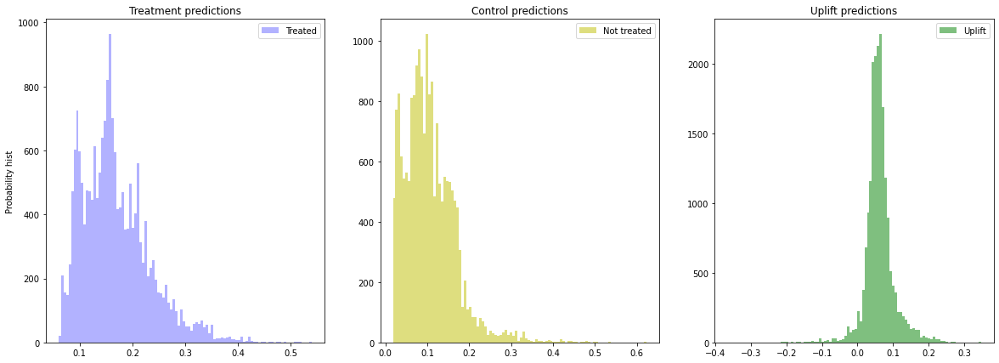

In [21]:
from sklift.models import TwoModels


tm = TwoModels(
    estimator_trmnt=CatBoostClassifier(iterations=50, thread_count=2, random_state=42, silent=True), 
    estimator_ctrl=CatBoostClassifier(iterations=50, thread_count=2, random_state=42, silent=True), 
    method='vanilla'
)
tm = tm.fit(
    X_train, y_train, treat_train,
    estimator_trmnt_fit_params={'cat_features': cat_features}, 
    estimator_ctrl_fit_params={'cat_features': cat_features}
)

uplift_tm = tm.predict(X_test)

tm_score10 = uplift_at_k(y_true=y_test, uplift=uplift_tm, treatment=treat_test, strategy='by_group', k=0.1)
tm_score20 = uplift_at_k(y_true=y_test, uplift=uplift_tm, treatment=treat_test, strategy='by_group', k=0.2)
tm_score30 = uplift_at_k(y_true=y_test, uplift=uplift_tm, treatment=treat_test, strategy='by_group', k=0.3)

models_results['approach'].append('TwoModels')
models_results['uplift@10%'].append(tm_score10)
models_results['uplift@20%'].append(tm_score20)
models_results['uplift@30%'].append(tm_score30)

plot_uplift_preds(trmnt_preds=tm.trmnt_preds_, ctrl_preds=tm.ctrl_preds_);

#### 6. в конце вывести единую таблицу сравнения метрик uplift@10%, uplift@20% этих 3 моделей

In [22]:
results = pd.DataFrame.from_dict(models_results)
results

,approach,uplift@10%,uplift@20%,uplift@30%
0,SoloModel,0.084566,0.075868,0.075700
1,ClassTransformation,0.083781,0.082512,0.080914
2,TwoModels,0.077519,0.073910,0.070741


#### 7. построить модель UpliftTreeClassifier и попытаться описать словами полученное дерево

In [23]:
X_train_tree = pd.concat([X_train.drop(['zip_code', 'channel'], 1), 
                          pd.get_dummies(X_train, prefix=['zip_code', 'channel'])], 1)
features = [col for col in X_train_tree]

Wall time: 35.3 s


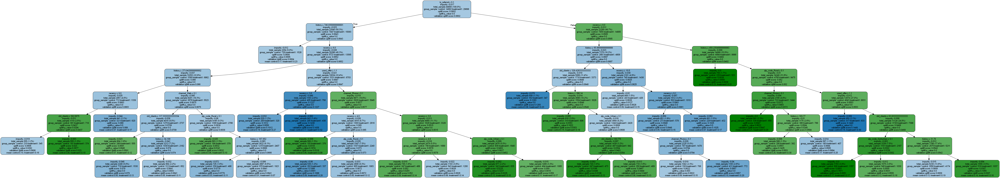

In [24]:
%%time
from IPython.display import Image
from causalml.inference.tree import UpliftTreeClassifier, UpliftRandomForestClassifier
from causalml.inference.tree import uplift_tree_string, uplift_tree_plot

uplift_model = UpliftTreeClassifier(max_depth=8, min_samples_leaf=500, min_samples_treatment=50,
                                    n_reg=100, evaluationFunction='KL', control_name='control')

uplift_model.fit(X_train_tree.values,
                 treatment=treat_train.map({1: 'treatment1', 0: 'control'}).values,
                 y=y_train)

graph = uplift_tree_plot(uplift_model.fitted_uplift_tree, features)
Image(graph.create_png())

Модель разделила пользователей на группы по заданным фичам и вывела результаты на листьях. Важен параметр p-value: чем он выше, тем более значими различия между treatment и control. Чем сильнее значение treatment превышает значение control и чем выше p-value, тем больше вероятность, что пользователь совершит действие, если ему сделать предложение. И наоборот: если параметр control выше, то пользователя лучше не беспокоить

#### 8. (опционально) для модели S learner (модель с дополнительным признаком коммуникации) построить зависимость таргета (конверсии - поле conversion) от значения uplift: 1) сделать прогноз и получить uplift для тестовой выборки 2) отсортировать тестовую выборку по uplift по убыванию 3) разбить на децили (pandas qcut вам в помощь) 4) для каждого дециля посчитать среднюю conversion

In [25]:
res_S_learner = pd.DataFrame({'uplift':uplift_sm, 'target': list(y_test)}, columns=['uplift', 'target'])
res_S_learner = res_S_learner.sort_values(by='uplift', ascending=False)
res_S_learner

,uplift,target
1956,0.262690,1
11594,0.262690,1
8270,0.262690,0
9189,0.223655,0
18861,0.217403,0
...,...,...
5127,-0.101885,0
18986,-0.102152,1
11632,-0.113475,0
8284,-0.113475,0


In [26]:
res_S_learner['deciles'] = pd.qcut(res_S_learner['uplift'], q=10)
res_S_learner

,uplift,target,deciles
1956,0.262690,1,"(0.0887, 0.263]"
11594,0.262690,1,"(0.0887, 0.263]"
8270,0.262690,0,"(0.0887, 0.263]"
9189,0.223655,0,"(0.0887, 0.263]"
18861,0.217403,0,"(0.0887, 0.263]"
...,...,...,...
5127,-0.101885,0,"(-0.181, 0.0391]"
18986,-0.102152,1,"(-0.181, 0.0391]"
11632,-0.113475,0,"(-0.181, 0.0391]"
8284,-0.113475,0,"(-0.181, 0.0391]"


In [27]:
res_S_learner.groupby(['deciles']).agg({'target':'mean'})

,target
deciles,
"(-0.181, 0.0391]",0.129167
"(0.0391, 0.0451]",0.103413
"(0.0451, 0.0487]",0.123820
"(0.0487, 0.0524]",0.127992
"(0.0524, 0.0562]",0.144785
"(0.0562, 0.0601]",0.133229
"(0.0601, 0.0655]",0.152242
"(0.0655, 0.0732]",0.161021
"(0.0732, 0.0887]",0.177083


#### 9. (опционально) построить модель UpliftRandomForestClassifier и попытаться описать словами полученное дерево

In [28]:
forest_uplift_model = UpliftRandomForestClassifier(n_estimators = 5,max_depth=10, min_samples_leaf=500, min_samples_treatment=50,
                                    n_reg=100, evaluationFunction='KL', control_name='control')

forest_uplift_model.fit(X_train_tree.values,
                 treatment=treat_train.map({1: 'treatment1', 0: 'control'}).values,
                 y=y_train.values)
graph = []
for i in range(len(forest_uplift_model.uplift_forest)):
    uplift_tree = forest_uplift_model.uplift_forest[i]
    graph.append(uplift_tree_plot(uplift_tree.fitted_uplift_tree, features))

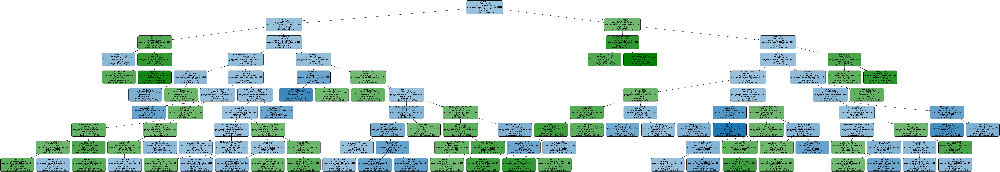

In [29]:
Image(graph[0].create_png())

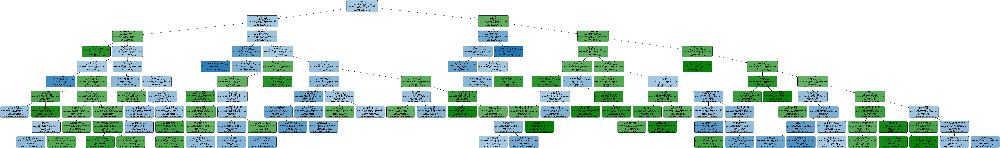

In [30]:
Image(graph[1].create_png())

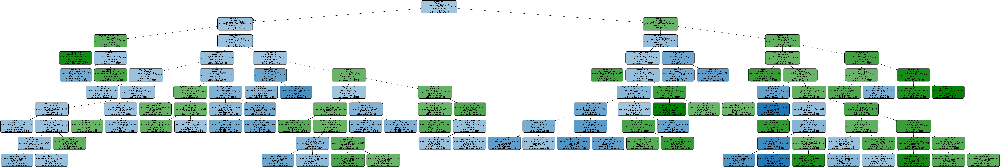

In [31]:
Image(graph[2].create_png())

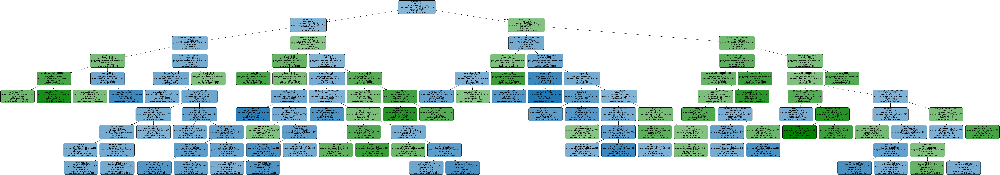

In [32]:
Image(graph[3].create_png())

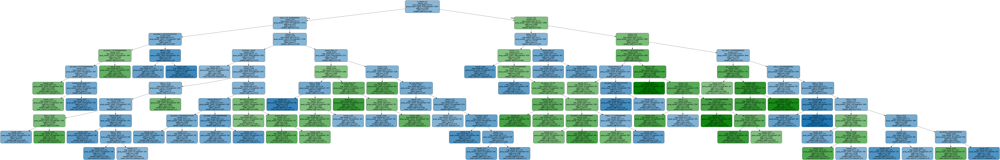

In [33]:
Image(graph[4].create_png())

Модель с большей уверенностью выделяет тех пользователей, которых лучше не беспокоить (высокий p=value, control выше treatment)